# How Probable is a Six Nations Grandslam in 2025?

This notebook uses statistical modelling of past Six Nations fixtures, as well as squad demographics, to predict the probabilities of home wins in order to estimate the overall probability of:
- A Six Nations Grandslam by any nation
- A Six Nations Grandslam for each nation

## Load Dependencies

In [1]:
import pandas as pd
import numpy as np
import pymc as pm
import bambi as bmb
import arviz as az
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


## Load Datasets

This first dataset loads squad demographics, such as the age and number of caps for each squad member in each side by year. 

In [2]:
squads = pd.read_csv('all_squads.csv')

squads.head()

,Year,Country,Age,Caps,Club
0,2020,Wales,25,29,Dragons
1,2020,Wales,25,9,Scarlets
2,2020,Wales,33,73,Scarlets
3,2020,Wales,21,6,Saracens
4,2020,Wales,23,6,Dragons


This second dataset loads team information, such as the table finish in the previous year and whether there is a new head coach

In [3]:
country_facts = pd.read_csv('country_perf.csv')
country_facts.tail(6)

,Year,PreviousTableFinish,Country,NewCoach
30,2020,1,Wales,1
31,2021,5,Wales,0
32,2022,1,Wales,0
33,2023,5,Wales,1
34,2024,5,Wales,0
35,2025,6,Wales,0


We'll also load the history of fixture results going back to 2020

In [4]:
history = pd.read_csv('six_nations_history.csv')
history.tail(6)

,Home,Away,HomeScore,AwayScore,Year,HomeWin
69,Italy,Scotland,31,29,2024,1
70,England,Ireland,23,22,2024,1
71,Wales,France,24,45,2024,0
72,Wales,Italy,21,24,2024,0
73,Ireland,Scotland,17,13,2024,1
74,France,England,33,31,2024,1


And finally, we'll get the fixtures for this year to make out-of-sample predictions

In [5]:
fixtures = pd.read_csv('six_nations_2025.csv')
fixtures.head()

,Home,Away,Year
0,France,Wales,2025
1,Scotland,Italy,2025
2,Ireland,England,2025
3,Italy,Wales,2025
4,England,France,2025


## Feature Engineering

Note: Review whether features show autocorrelation

Note: Try stacking of data to see if it improves prediction quality.

In [6]:
# estimate squad facts

avg_age = squads.groupby(['Year','Country'])['Age'].mean().reset_index().rename(columns={'Age':'Avg_Age'})
std_age = squads.groupby(['Year','Country'])['Age'].std().reset_index().rename(columns={'Age':'Std_Age'})
avg_caps = squads.groupby(['Year','Country'])['Caps'].mean().reset_index().rename(columns={'Caps':'Avg_Caps'})
std_caps = squads.groupby(['Year','Country'])['Caps'].std().reset_index().rename(columns={'Caps':'Std_Caps'})
num_clubs = squads.groupby(['Year','Country'])['Club'].nunique()

In [7]:
# merge measures 

squad_measures = pd.merge(avg_age, avg_caps, how="left", on=["Year", "Country"])
squad_measures = pd.merge(squad_measures, std_caps, how="left", on=["Year", "Country"])
squad_measures = pd.merge(squad_measures, std_age, how="left", on=["Year", "Country"])
squad_measures = pd.merge(squad_measures, num_clubs, how="left", on=["Year", "Country"])


In [8]:
# augment measures

country_dims = pd.merge(squad_measures, country_facts, how="left", on=["Year", "Country"])

In [9]:
# duplicate for home and away 

home_dims = country_dims.copy().rename(columns={'Year':'Year', 'Country':'Home', 'Avg_Age':'Home_Avg_Age', 'Avg_Caps':'Home_Avg_Caps', 
                                                'Std_Caps':'Home_Std_Caps', 'Std_Age':'Home_Std_Age', 'Club':'Home_Clubs',
                                                'PreviousTableFinish':'Home_PreviousTableFinish', 'NewCoach':'Home_NewCoach'})


In [10]:
away_dims = country_dims.copy().rename(columns={'Year':'Year', 'Country':'Away', 'Avg_Age':'Away_Avg_Age', 'Avg_Caps':'Away_Avg_Caps', 
                                                'Std_Caps':'Away_Std_Caps', 'Std_Age':'Away_Std_Age', 'Club':'Away_Clubs',
                                                'PreviousTableFinish':'Away_PreviousTableFinish', 'NewCoach':'Away_NewCoach'})


In [11]:
# merge with fixture data 

history = pd.merge(history,home_dims, how="left", on=["Year", "Home"])
history = pd.merge(history,away_dims,how="left", on=["Year", "Away"])

fixtures = pd.merge(fixtures,home_dims, how="left", on=["Year", "Home"])
fixtures = pd.merge(fixtures,away_dims,how="left", on=["Year", "Away"])



In [12]:
fixtures

,Home,Away,Year,Home_Avg_Age,Home_Avg_Caps,Home_Std_Caps,Home_Std_Age,Home_Clubs,Home_PreviousTableFinish,Home_NewCoach,Away_Avg_Age,Away_Avg_Caps,Away_Std_Caps,Away_Std_Age,Away_Clubs,Away_PreviousTableFinish,Away_NewCoach
0,France,Wales,2025,26.190476,20.904762,20.273507,4.043894,11,2,0,26.882353,22.823529,26.974141,4.080736,10,6,0
1,Scotland,Italy,2025,27.486486,27.108108,24.440158,3.069760,10,4,0,26.633333,27.600000,20.349701,3.045441,11,5,0
2,Ireland,England,2025,29.388889,40.972222,35.715932,4.357442,4,1,1,25.805556,27.055556,28.787839,3.232155,8,3,0
3,Italy,Wales,2025,26.633333,27.600000,20.349701,3.045441,11,5,0,26.882353,22.823529,26.974141,4.080736,10,6,0
4,England,France,2025,25.805556,27.055556,28.787839,3.232155,8,3,0,26.190476,20.904762,20.273507,4.043894,11,2,0
5,Scotland,Ireland,2025,27.486486,27.108108,24.440158,3.069760,10,4,0,29.388889,40.972222,35.715932,4.357442,4,1,1
6,Wales,Ireland,2025,26.882353,22.823529,26.974141,4.080736,10,6,0,29.388889,40.972222,35.715932,4.357442,4,1,1
7,England,Scotland,2025,25.805556,27.055556,28.787839,3.232155,8,3,0,27.486486,27.108108,24.440158,3.069760,10,4,0
8,Italy,France,2025,26.633333,27.600000,20.349701,3.045441,11,5,0,26.190476,20.904762,20.273507,4.043894,11,2,0
9,Ireland,France,2025,29.388889,40.972222,35.715932,4.357442,4,1,1,26.190476,20.904762,20.273507,4.043894,11,2,0


## Exploratory Data Analysis

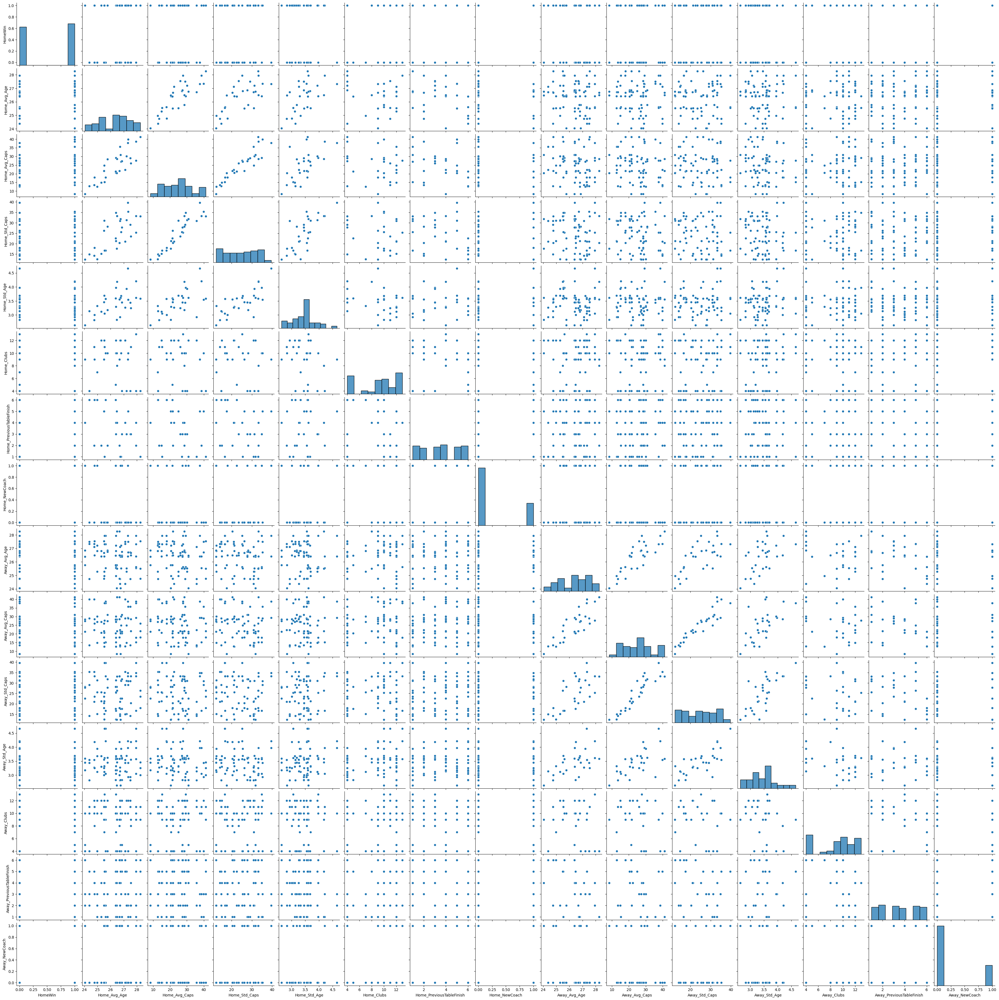

In [13]:
sns.pairplot(history[['HomeWin',
       'Home_Avg_Age', 'Home_Avg_Caps', 'Home_Std_Caps', 'Home_Std_Age',
       'Home_Clubs', 'Home_PreviousTableFinish', 'Home_NewCoach',
       'Away_Avg_Age', 'Away_Avg_Caps', 'Away_Std_Caps', 'Away_Std_Age',
       'Away_Clubs', 'Away_PreviousTableFinish', 'Away_NewCoach']])

<Axes: >

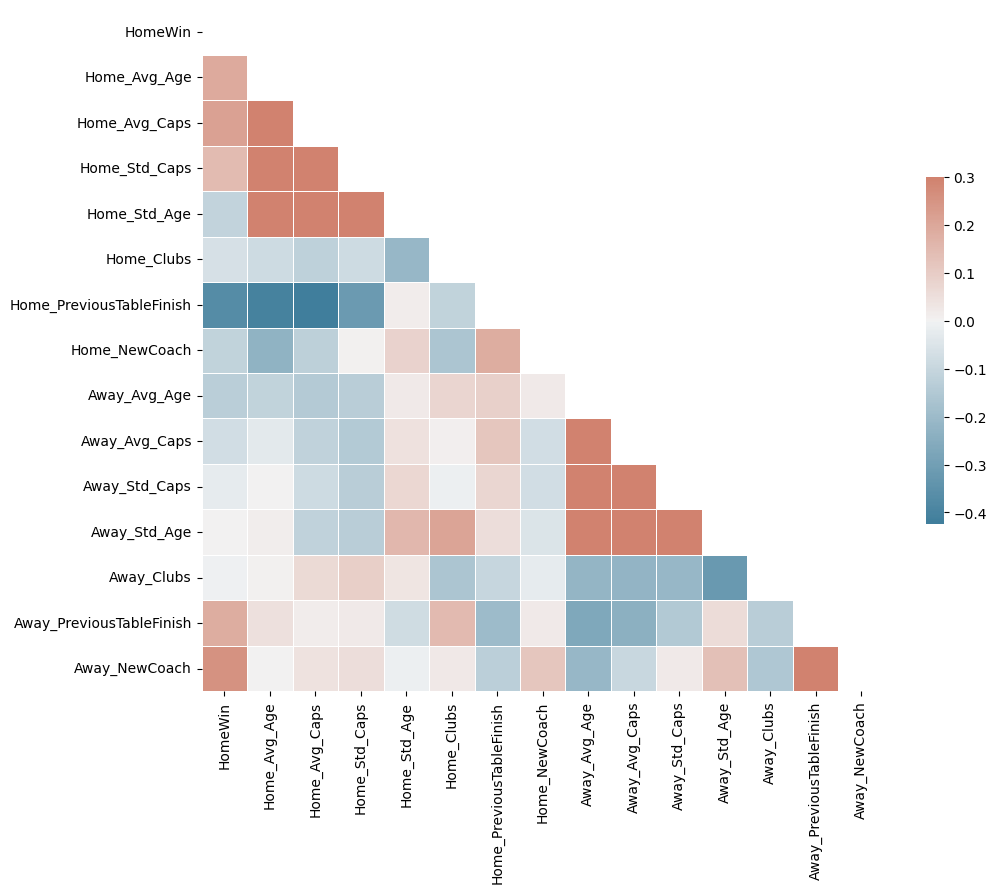

In [14]:
# Compute the correlation matrix
corr = history[['HomeWin',
       'Home_Avg_Age', 'Home_Avg_Caps', 'Home_Std_Caps', 'Home_Std_Age',
       'Home_Clubs', 'Home_PreviousTableFinish', 'Home_NewCoach',
       'Away_Avg_Age', 'Away_Avg_Caps', 'Away_Std_Caps', 'Away_Std_Age',
       'Away_Clubs', 'Away_PreviousTableFinish', 'Away_NewCoach']].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

What does our exploratory analysis tell us?

- The number of clubs that make up a squad are not highly correlated with winning
- Having a new coach at the beginning of the tournament is not highly correlated with winning at home, but it is for away fixtures. This may be driven by home advantage or simply because there aren't many fixtures where teams have a new coach.
- Previous table finish is strongly correlated with a home win. The negative correlation for the home side is explained that a 'lower' table finish means you are higher up the table (i.e. 1 = 1st place)
- There is strong autocorrelation with age and caps
- The average age and caps is more highly correlated with winning than the spread of ages and caps
- We should rescale age and caps as a composite measure - which would be an indicator of the number of caps your squad has relative to their age. This is quite apt since in 2025 France actually has one of the youngest squads and the lowest average number of caps, however the squad are reasonably well established and are in the running to win the tournament this year.

## Reduce Features following Exploratory Analysis

In [15]:
history['Home_Caps_Age'] = history['Home_Avg_Caps']/history['Home_Avg_Age']
history['Away_Caps_Age'] = history['Away_Avg_Caps']/history['Away_Avg_Age']

fixtures['Home_Caps_Age'] = fixtures['Home_Avg_Caps']/fixtures['Home_Avg_Age']
fixtures['Away_Caps_Age'] = fixtures['Away_Avg_Caps']/fixtures['Away_Avg_Age']


<Axes: >

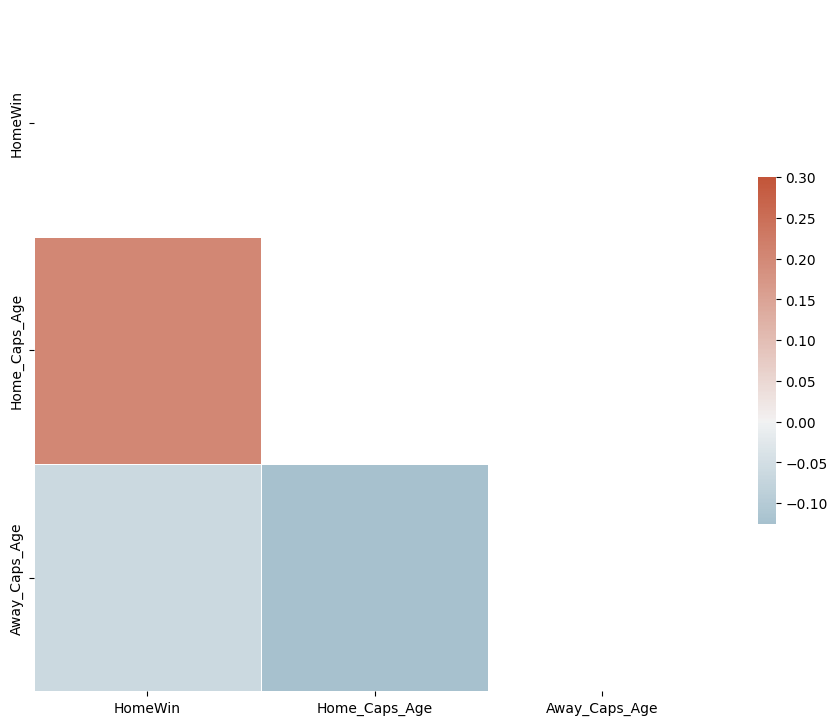

In [16]:
# Compute the correlation matrix
corr = history[['HomeWin','Home_Caps_Age','Away_Caps_Age']].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [18]:
# drop target variable, scores and autocorrelated variables and variables with low correlation to target
history = history[['Home', 'Away',  'Year','HomeWin',
      'Home_PreviousTableFinish', 'Home_NewCoach',
       'Away_PreviousTableFinish', 'Away_NewCoach',
       'Home_Caps_Age', 'Away_Caps_Age']]
fixtures = fixtures[['Home', 'Away', 'Year',
      'Home_PreviousTableFinish', 'Home_NewCoach',
       'Away_PreviousTableFinish', 'Away_NewCoach',
       'Home_Caps_Age', 'Away_Caps_Age']]

## Augment Dataset with inverted fixtures 

There is not a home & away fixture in the six nations, and predictive models cannot discern that France v Wales is the same as Wales v France played in a different location. Here we invert the data to see if it improves predictive performance. Using the non-inverted dataset Logistic Regressions had ~60% accuracy, Naive Bayes had ~67% accuracy.

In [22]:
history.head()

,Home,Away,Year,HomeWin,Home_PreviousTableFinish,Home_NewCoach,Away_PreviousTableFinish,Away_NewCoach,Home_Caps_Age,Away_Caps_Age
0,Wales,Ireland,2023,0,5,1,2,0,1.380811,1.383239
1,England,Scotland,2023,0,3,1,4,0,1.106204,0.990161
2,Italy,France,2023,0,6,0,1,0,0.695752,0.596459
3,Ireland,France,2023,1,2,0,1,0,1.383239,0.596459
4,Scotland,Wales,2023,1,4,0,5,1,0.990161,1.380811


In [23]:
# history stacked - swap home and away 

history_swap = history.copy()



In [24]:

history_swap['AwayWin'] = 1-history_swap['HomeWin']

history_swap.drop(columns=['HomeWin'],inplace=True)

history_swap = history_swap.rename(columns={'Home':'Away','Away':'Home','AwayWin':'HomeWin'})

history_swap = history_swap[['Home','Away','Year','HomeWin']]

history_swap = pd.merge(history_swap,home_dims, how="left", on=["Year", "Home"])
history_swap = pd.merge(history_swap,away_dims,how="left", on=["Year", "Away"])

history_swap['Home_Caps_Age'] = history_swap['Home_Avg_Caps']/history_swap['Home_Avg_Age']
history_swap['Away_Caps_Age'] = history_swap['Away_Avg_Caps']/history_swap['Away_Avg_Age']

history_swap = history_swap[['Home', 'Away',  'Year','HomeWin',
      'Home_PreviousTableFinish', 'Home_NewCoach',
       'Away_PreviousTableFinish', 'Away_NewCoach',
       'Home_Caps_Age', 'Away_Caps_Age']]
history_swap.head()
        

,Home,Away,Year,HomeWin,Home_PreviousTableFinish,Home_NewCoach,Away_PreviousTableFinish,Away_NewCoach,Home_Caps_Age,Away_Caps_Age
0,Ireland,Wales,2023,1,2,0,5,1,1.383239,1.380811
1,Scotland,England,2023,1,4,0,3,1,0.990161,1.106204
2,France,Italy,2023,1,1,0,6,0,0.596459,0.695752
3,France,Ireland,2023,0,1,0,2,0,0.596459,1.383239
4,Wales,Scotland,2023,0,5,1,4,0,1.380811,0.990161


In [25]:
history_swap.shape

(75, 10)

In [26]:
history = pd.concat([history,history_swap],axis=0)
history.shape

(150, 10)

## Data Standardisation

Here we need to be careful of data leakage and perform standardisation on the split datasets.

In [34]:
history=history.reset_index()
history=history[['Home', 'Away',  'Year','HomeWin',
      'Home_PreviousTableFinish', 'Home_NewCoach',
       'Away_PreviousTableFinish', 'Away_NewCoach',
       'Home_Caps_Age', 'Away_Caps_Age']]
history.tail()


,Home,Away,Year,HomeWin,Home_PreviousTableFinish,Home_NewCoach,Away_PreviousTableFinish,Away_NewCoach,Home_Caps_Age,Away_Caps_Age
145,Ireland,England,2024,0,1,0,4,0,1.457856,1.076520
146,France,Wales,2024,1,2,0,5,0,0.812569,0.847751
147,Italy,Wales,2024,1,6,1,5,0,0.725653,0.847751
148,Scotland,Ireland,2024,0,3,0,1,0,0.946927,1.457856
149,England,France,2024,0,4,0,2,0,1.076520,0.812569


In [35]:
# do one hot encoding
ohe_home = OneHotEncoder()
ohe_away = OneHotEncoder()

ohe_home.fit(pd.DataFrame(history['Home']))
Home_Hist = ohe_home.transform(pd.DataFrame(history['Home'])).toarray()

ohe_away = OneHotEncoder()

ohe_away.fit(pd.DataFrame(history['Away']))
Away_Hist = ohe_away.transform(pd.DataFrame(history['Away'])).toarray()

ohe_home2 = OneHotEncoder()
ohe_away2 = OneHotEncoder()

ohe_home2.fit(pd.DataFrame(fixtures['Home']))
Home_2025 = ohe_home2.transform(pd.DataFrame(fixtures['Home'])).toarray()

ohe_away2 = OneHotEncoder()

ohe_away2.fit(pd.DataFrame(fixtures['Away']))
Away_2025 = ohe_away2.transform(pd.DataFrame(fixtures['Away'])).toarray()

HH = pd.DataFrame(Home_Hist, columns=ohe_home.categories_[0]).add_prefix('Home_')
AH = pd.DataFrame(Away_Hist, columns=ohe_away.categories_[0]).add_prefix('Away_')

HF = pd.DataFrame(Home_2025, columns=ohe_home2.categories_[0]).add_prefix('Home_')
AF = pd.DataFrame(Away_2025, columns=ohe_away2.categories_[0]).add_prefix('Away_')

X_all = pd.concat([HH,AH,history],axis=1)
X_2025 = pd.concat([HF,AF,fixtures],axis=1)

## Split Datasets into Train/Test

In [43]:
X_train = X_all[X_all['Year'] != 2024]
X_test = X_all[X_all['Year'] == 2024]

In [44]:
y_train = X_all[X_all['Year'] != 2024][['HomeWin']]
y_test = X_all[X_all['Year'] == 2024][['HomeWin']]

In [45]:
print('Train Dataset:',X_train.shape,y_train.shape)
print('Test Dataset:',X_test.shape,y_test.shape)

Train Dataset: (120, 22) (120, 1)
Test Dataset: (30, 22) (30, 1)


In [47]:
X_all.head()

,Home_England,Home_France,Home_Ireland,Home_Italy,Home_Scotland,Home_Wales,Away_England,Away_France,Away_Ireland,Away_Italy,...,Home,Away,Year,HomeWin,Home_PreviousTableFinish,Home_NewCoach,Away_PreviousTableFinish,Away_NewCoach,Home_Caps_Age,Away_Caps_Age
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,Wales,Ireland,2023,0,5,1,2,0,1.380811,1.383239
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,England,Scotland,2023,0,3,1,4,0,1.106204,0.990161
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,Italy,France,2023,0,6,0,1,0,0.695752,0.596459
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,Ireland,France,2023,1,2,0,1,0,1.383239,0.596459
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,Scotland,Wales,2023,1,4,0,5,1,0.990161,1.380811


## Drop target variable from inputs

In [48]:
X_train.drop(columns=['Home','Away','HomeWin'],inplace=True)
X_train.keys()

X_test.drop(columns=['Home','Away','HomeWin'],inplace=True)
X_test.keys()

X_all.drop(columns=['Home','Away','HomeWin'],inplace=True)
X_all.keys()

X_2025.drop(columns=['Home','Away'],inplace=True)
X_2025.keys()

/tmp/ipykernel_12058/169646824.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.drop(columns=['Home','Away','HomeWin'],inplace=True)
/tmp/ipykernel_12058/169646824.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.drop(columns=['Home','Away','HomeWin'],inplace=True)


Index(['Home_England', 'Home_France', 'Home_Ireland', 'Home_Italy',
       'Home_Scotland', 'Home_Wales', 'Away_England', 'Away_France',
       'Away_Ireland', 'Away_Italy', 'Away_Scotland', 'Away_Wales', 'Year',
       'Home_PreviousTableFinish', 'Home_NewCoach', 'Away_PreviousTableFinish',
       'Away_NewCoach', 'Home_Caps_Age', 'Away_Caps_Age'],
      dtype='object')

## Scale Numerical Features

In [49]:
from sklearn.preprocessing import minmax_scale

X_train = minmax_scale(X_train, axis=0) 
X_test = minmax_scale(X_test, axis=0) 
X_all = minmax_scale(X_all, axis=0) 
X_2025 = minmax_scale(X_2025, axis=0)

## Point Estimate Model for Fixture Result Probabilities

In [50]:
lr = LogisticRegression().fit(X_train,y_train)

y_pred = lr.predict(X_test)

/opt/conda/lib/python3.11/site-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


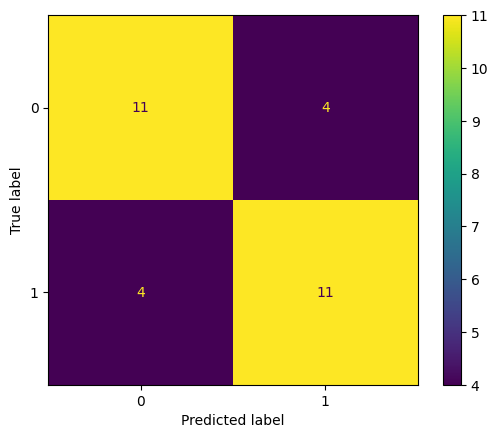

In [51]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(lr,X_test,y_test)

Note: by stacking historic data we've improved the model accuracy to 73%

In [52]:
from sklearn.naive_bayes import BernoulliNB, GaussianNB
nb = BernoulliNB()
nbc = nb.fit(X_train, y_train)

/opt/conda/lib/python3.11/site-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


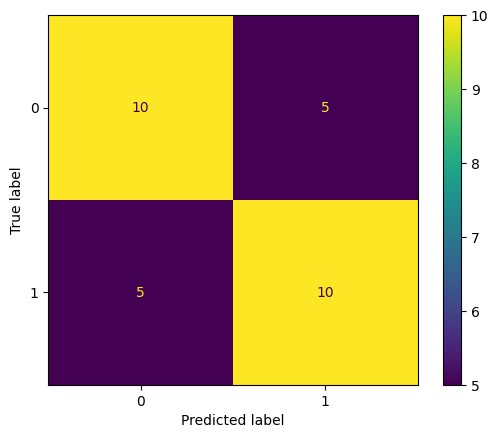

In [53]:
ConfusionMatrixDisplay.from_estimator(nbc,X_test,y_test)

Note: A logistic regression is now better than the Naive Bayes model, and has better (though not necessarily well) calibrated probabilities.

## Predictions for 2025

In [54]:
y = history['HomeWin']

lr = LogisticRegression().fit(X_all,y)

y_pred = lr.predict(X_2025)

In [55]:
prediction_probabilities = lr.predict_proba(X_2025)

prediction_probabilities

array([[0.13671864, 0.86328136],
       [0.22059311, 0.77940689],
       [0.24010609, 0.75989391],
       [0.48966661, 0.51033339],
       [0.66950023, 0.33049977],
       [0.72818536, 0.27181464],
       [0.90796092, 0.09203908],
       [0.54156953, 0.45843047],
       [0.85832853, 0.14167147],
       [0.39027118, 0.60972882],
       [0.21356769, 0.78643231],
       [0.25057451, 0.74942549],
       [0.90444752, 0.09555248],
       [0.7571082 , 0.2428918 ],
       [0.36835911, 0.63164089]])

## Append Prediction Probabilities to 2025 Fixture List

In [56]:
pred25 = fixtures.copy()
pred25['HomeWinPred'] = y_pred
pred25['Home_Win_Probability'] =  prediction_probabilities[:,1]
pred25['Away_Win_Probability'] =  prediction_probabilities[:,0]

In [57]:
pred25[['Home','Away','HomeWinPred','Home_Win_Probability','Away_Win_Probability']]

,Home,Away,HomeWinPred,Home_Win_Probability,Away_Win_Probability
0,France,Wales,1,0.863281,0.136719
1,Scotland,Italy,1,0.779407,0.220593
2,Ireland,England,1,0.759894,0.240106
3,Italy,Wales,1,0.510333,0.489667
4,England,France,0,0.330500,0.669500
5,Scotland,Ireland,0,0.271815,0.728185
6,Wales,Ireland,0,0.092039,0.907961
7,England,Scotland,0,0.458430,0.541570
8,Italy,France,0,0.141671,0.858329
9,Ireland,France,1,0.609729,0.390271


Looking at the fixture probabilities, these predictions are broadly in-line with what pundits have been expecting:
- Ireland expected to do well based on previous form and a chance to get a three-peat (third consecutive title)
- France expected to do very well, particularly at home
- England have a reasonably strong chance, but in all likelihood will finish mid-table
- Scotland are expected to have the slight edge in the Calcutta cup again this year, but it will be tight
- Italy and Wales will be expected to compete to avoid the wooden spoon, with Italy expected to be slight favourites

## Estimating Grandslam Probabilities with Monte Carlo Methods

We can take the output of our point prediction model and use these predicted probabilities to estimate the likelihood of a Six Nations Grandslam in 2025. There are some assumptions to this model:
- Win probabilities are normally distributed around their class level probabilities. This is a fairly strong assumption and could be improved on by leveraging a more probabalistic model, such as a Bayesian Regression to estimate the posterior distribution of HomeWin probability directly from an MCMC sampler
- The probability of winning fixtures are independent from other fixtures. Whilst this may sound like a strong assumption I don't believe it is unreasonable in the professional game and in previous years sides like Italy have snuck in a win towards the end of their fixtures despite losing several beforehand and likewise Scotland have beaten England five years running but have not had consistent performances around this

In [58]:
from numpy.random import choice

In [59]:
def select_winners(row):
    return choice([row['Home'],row['Away']],1,p=[row['Home_Win_Probability'],row['Away_Win_Probability']])[0]
                                        


In [60]:
simulations = pd.DataFrame(columns=['Simulation','Home','Away','Winner'])

num_simulations = 10000

for i in range(num_simulations):
    iteration = [i]*15
    home = pred25['Home']
    away = pred25['Away']
    winner=pred25.apply(select_winners,axis=1)
    next_simulation = pd.DataFrame({'Simulation':iteration,'Home':home,'Away':away,'Winner':winner})
    simulations = pd.concat([simulations,next_simulation],axis=0)
    

In [61]:
simulations.head()

,Simulation,Home,Away,Winner
0,0,France,Wales,France
1,0,Scotland,Italy,Scotland
2,0,Ireland,England,England
3,0,Italy,Wales,Wales
4,0,England,France,France


In [62]:
tournament_wins = simulations.copy()
tournament_wins.rename(columns={'Winner':'Team'},inplace=True)
tournament_wins['Wins'] = 0
tournament_wins = tournament_wins[['Simulation','Team','Wins']].groupby(['Simulation','Team'])['Wins'].count().reset_index()

In [63]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

In [64]:
tournament_wins['Wins_Jittered'] = tournament_wins['Wins'] + np.random.randn(len(tournament_wins))*0.35

for i in range(len(tournament_wins)):
    if tournament_wins['Wins_Jittered'][i] > 5:
        tournament_wins['Wins_Jittered'][i] = 5
    if tournament_wins['Wins_Jittered'][i] < 0 :
        tournament_wins['Wins_Jittered'][i] = 0

/tmp/ipykernel_12058/32915338.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  tournament_wins['Wins_Jittered'][i] = 5
/tmp/ipykernel_12058/32915338.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

/tmp/ipykernel_12058/4118496703.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Team', y='Wins_Jittered', data=tournament_wins, palette=team_colors)


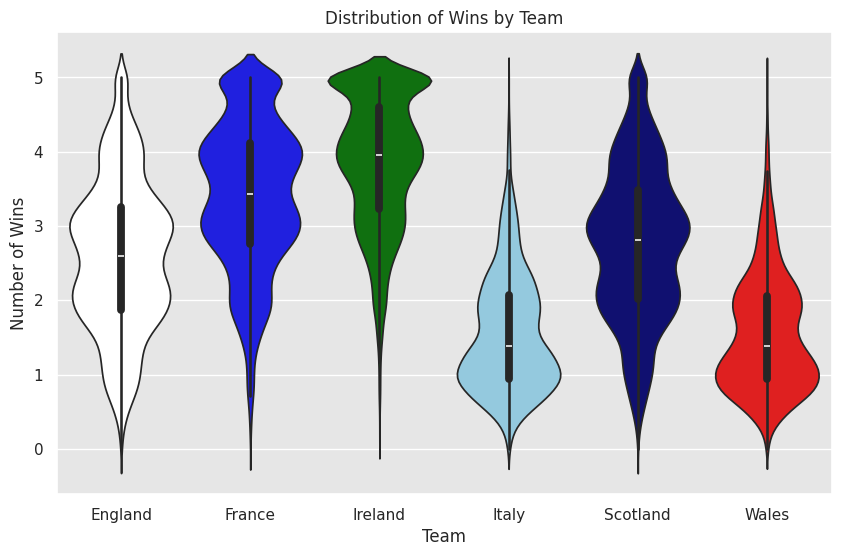

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


# Define custom color palette
team_colors = {'France': 'blue', 'Ireland': 'green', 'Italy': 'skyblue', 
              'Wales': 'red', 'Scotland': 'navy', 'England': 'white'}

# Set Seaborn style with grey background
sns.set_style("darkgrid", {"axes.facecolor": ".9"}) 

# Create violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='Team', y='Wins_Jittered', data=tournament_wins, palette=team_colors)

# Customize plot
plt.title('Distribution of Wins by Team')
plt.xlabel('Team')
plt.ylabel('Number of Wins')

# Show plot
plt.show()


How can we interpret this plot?

From above we can see that:
- France and Ireland are clear favourites to win, though based on past form Ireland might be expected to be more likely to win a grandslam
- Its important to note that past form doesn't always predict current form, for example Ireland have a new head coach, the oldest team and are looking at a rebuild phase following the retirement of their key playmaker Jonny Sexton
- England and Scotland could cause some upsets, but are likely to be battling it out for the upper-mid table position. Based on recent form Scotland arem ore likely to get 3 wins and England 2 wins, but there is more uncertainty on how England could do in the competition
- Wales and Italy are scrapping it out for the bottom of the table, with both teams fairly likely to pick up at least one win in the tournament, though this may be the Italy-Wales fixture, which Italy are possible favourites for given home advantage

## So How Likely is a Grandslam?

It is difficult to predict an overall winner using our model since we cannot account for bonus points (given to teams who score more than 4 trys in a game or lose by 7 points or less). That said we can estimate the likelihood of a grandslam by taking our prediction probabilities and simulating the tournament many times.

In [66]:
grandslams = tournament_wins[tournament_wins['Wins']==5]

prob_grandslam = len(grandslams) / num_simulations

print('Expected Probability of a Grandslam in 2025:',prob_grandslam)

Expected Probability of a Grandslam in 2025: 0.4479


In [67]:
grandslam_by_team = grandslams[['Team','Wins']].groupby('Team').count().reset_index()

In [68]:
grandslam_by_team['Grandslam_Probability'] = grandslam_by_team['Wins'] / num_simulations

for i in range(len(grandslam_by_team)):
    team = grandslam_by_team['Team'][i]
    prob = grandslam_by_team['Grandslam_Probability'][i]
    print(team,'have an Expected Probability of a Grandslam in 2025 of:',prob)

England have an Expected Probability of a Grandslam in 2025 of: 0.0211
France have an Expected Probability of a Grandslam in 2025 of: 0.1198
Ireland have an Expected Probability of a Grandslam in 2025 of: 0.2729
Italy have an Expected Probability of a Grandslam in 2025 of: 0.0007
Scotland have an Expected Probability of a Grandslam in 2025 of: 0.0332
Wales have an Expected Probability of a Grandslam in 2025 of: 0.0002


## How do our Probabilities Compare to Bookmaker Odds?

Bet365 Posted the below odds on January 1st 2025 for Six Nations Grandslams:

- No Winner 5/6 [this implies Winner odds of 6/5]
- Ireland 10/3
- France 9/2
- England 9/1
- Scotland 14/1
- Wales 500/1
- Italy 2000/1

We can convert the betting odds to a probability as below:

$$ \text{For odds given in the format: } Odds_A / Odds_B $$

$$ \text{We can convert this to a probability using the formula} : Prob_{win} = 1 - (B / (A + B)  $$


Using this we can compare our model to the bookmakers odds:

| Grandslam By | Bookmaker Probability   | Our Model Probability |
| -------- | ------- |------- |
| Any Team | 45.45%  |   44.79%  |
| Ireland | 23.08% | 27.29%     |
| France | 18.18%    | 11.98%    |
| England |10.00%    | 2.11%    |
| Scotland |6.67%    | 3.32%    |
| Wales |0.20%    | 0.02%   |
| Italy |0.05%    | 0.07%    |


Note: the odds will have been updated since then due to squad changes and injuries - for example Scotland have lost their captain to injury and Ireland have an possible injury at fly-half pushing up the odds of France winning overall. This is something we can't account for in our model since we don't have individual player information incorporated.

Its also important to remember that bookmaker odds are Implied Odds, since they factor in a profit margin for the bookmaker and do not necessarily reflect the True Odds of the outcome. 

## Estimating Probabilities Directly with a Probabalistic Model

In [72]:
model = bmb.Model("HomeWin ~ Home, Away, Year, Home_PreviousTableFinish, Home_NewCoach, Away_PreviousTableFinish, Away_NewCoach,Home_Caps_Age, Away_Caps_Age",history,family="bernoulli")
fit = model.fit(draws=10000,chains=4)


Modeling the probability that HomeWin==1
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [Intercept, Home]


Output()

Output()

Output()

Output()

Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 29 seconds.


<Axes: >

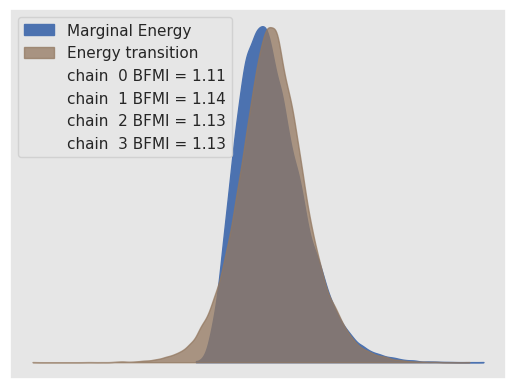

In [73]:
az.plot_energy(fit)

In [90]:
model.predict(idata=fit,data=fixtures,inplace=True,kind='response')

In [93]:
fit['posterior_predictive'].to_dataframe

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

In [97]:
posterior_predictive = fit['posterior_predictive'].to_dataframe().reset_index()

In [103]:
posterior_predictive.shape

(600000, 4)

In [106]:
fixtures25 = pred25[['Home','Away']].reset_index()
fixtures25.rename(columns={'index':'__obs__'},inplace=True)
fixtures25.head()

,__obs__,Home,Away
0,0,France,Wales
1,1,Scotland,Italy
2,2,Ireland,England
3,3,Italy,Wales
4,4,England,France


In [107]:
fixtures25_pp = pd.merge(posterior_predictive, fixtures25, how="left", on=['__obs__'])

In [109]:
fixtures25_pp.shape

(600000, 6)

In [114]:
fixtures25_pp.head()

,chain,draw,__obs__,HomeWin,Home,Away
0,0,0,0,1,France,Wales
1,0,0,1,0,Scotland,Italy
2,0,0,2,1,Ireland,England
3,0,0,3,1,Italy,Wales
4,0,0,4,1,England,France


In [116]:
def fetch_winner(row):
    if row['HomeWin'] == 1:
        winner = row['Home']
    else:
        winner = row['Away']
    return winner

In [118]:
pp_winners = fixtures25_pp.apply(fetch_winner,axis=1)

In [120]:
fixtures25_pp['Winner'] = pp_winners
fixtures25_pp.head()

,chain,draw,__obs__,HomeWin,Home,Away,Winner
0,0,0,0,1,France,Wales,France
1,0,0,1,0,Scotland,Italy,Italy
2,0,0,2,1,Ireland,England,Ireland
3,0,0,3,1,Italy,Wales,Italy
4,0,0,4,1,England,France,England


In [121]:
fixtures25_pp['Wins'] = 0
fixtures25_pp_out = fixtures25_pp.groupby(['chain','draw','Winner'])['Wins'].count().reset_index()

fixtures25_pp_out.head(25)

,chain,draw,Winner,Wins
0,0,0,England,3
1,0,0,France,4
2,0,0,Ireland,3
3,0,0,Italy,2
4,0,0,Scotland,2
5,0,0,Wales,1
6,0,1,England,3
7,0,1,France,2
8,0,1,Ireland,5
9,0,1,Italy,1


In [122]:
fixtures25_pp_out['Wins_Jittered'] = fixtures25_pp_out['Wins'] + np.random.randn(len(fixtures25_pp_out))*0.35

for i in range(len(fixtures25_pp_out)):
    if fixtures25_pp_out['Wins_Jittered'][i] > 5:
        fixtures25_pp_out['Wins_Jittered'][i] = 5
    if fixtures25_pp_out['Wins_Jittered'][i] < 0 :
        fixtures25_pp_out['Wins_Jittered'][i] = 0

/tmp/ipykernel_12058/3923029489.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  fixtures25_pp_out['Wins_Jittered'][i] = 5
/tmp/ipykernel_12058/3923029489.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fro

/tmp/ipykernel_12058/3576526816.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Winner', y='Wins_Jittered', data=fixtures25_pp_out, palette=team_colors)


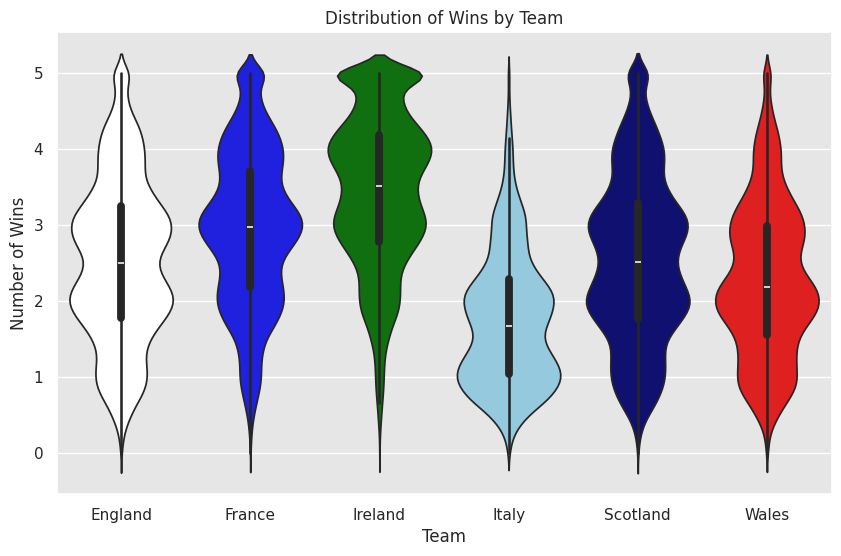

In [124]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


# Define custom color palette
team_colors = {'France': 'blue', 'Ireland': 'green', 'Italy': 'skyblue', 
              'Wales': 'red', 'Scotland': 'navy', 'England': 'white'}

# Set Seaborn style with grey background
sns.set_style("darkgrid", {"axes.facecolor": ".9"}) 

# Create violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='Winner', y='Wins_Jittered', data=fixtures25_pp_out, palette=team_colors)

# Customize plot
plt.title('Distribution of Wins by Team')
plt.xlabel('Team')
plt.ylabel('Number of Wins')

# Show plot
plt.show()


We can see from the above that using a Probabalistic model we can estimate the posterior probabilities directly without having to hand-code our Monte Carlo simulations. This plot is broadly very similar, however Italy and Wales are expected to do slightly better and France and Ireland are expected to do slightly worse. This is, unfortunately, a drawback of Bayesian Hierarchical Regression models known as `shrinkage` where levels that sit on the extreme are shrunk towards the mean value.

## How have our probabilities shifted using the Bayesian Model?

We ran 4 chains with 10,000 samples - this means we can estimate our probabilities by finding the count of wins and dividing by the number of samples (40,000)

In [125]:
num_simulations=40000

grandslams = fixtures25_pp_out[fixtures25_pp_out['Wins']==5]

prob_grandslam = len(grandslams) / num_simulations

print('Expected Probability of a Grandslam in 2025:',prob_grandslam)

Expected Probability of a Grandslam in 2025: 0.255175


In [126]:
grandslam_by_team = grandslams[['Winner','Wins']].groupby('Winner').count().reset_index()

In [128]:
grandslam_by_team['Grandslam_Probability'] = grandslam_by_team['Wins'] / num_simulations

for i in range(len(grandslam_by_team)):
    team = grandslam_by_team['Winner'][i]
    prob = grandslam_by_team['Grandslam_Probability'][i]
    print(team,'have an Expected Probability of a Grandslam in 2025 of:',prob)

England have an Expected Probability of a Grandslam in 2025 of: 0.022625
France have an Expected Probability of a Grandslam in 2025 of: 0.047075
Ireland have an Expected Probability of a Grandslam in 2025 of: 0.142425
Italy have an Expected Probability of a Grandslam in 2025 of: 0.001825
Scotland have an Expected Probability of a Grandslam in 2025 of: 0.02935
Wales have an Expected Probability of a Grandslam in 2025 of: 0.011875


## Comparing our Two Models with the Bookmaker Odds

Below we can see how our probabilities have shifted using a different model. Its an important reminder that modelling is used for quantifying uncertainty and can be sensitive to the inputs you feed it and the assumptions you make.

| Grandslam By | Bookmaker Probability   | Logistic Regression + Monte Carlo | Bayesian Logistic Regression |
| -------- | ------- |------- | ------- |
| Any Team | 45.45%  |   44.79%  | 25.52% |
| Ireland | 23.08% | 27.29%     | 14.24% |
| France | 18.18%    | 11.98%    | 4.71% |
| England |10.00%    | 2.11%    | 2.26% |
| Scotland |6.67%    | 3.32%    | 2.94% |
| Wales |0.20%    | 0.02%   | 1.19% |
| Italy |0.05%    | 0.07%    | 0.18% |


## Findings

Our analysis has found that:
- In the 2025 Six Nations France are punching above their weight given the relatively youthful side they've got 
- Ireland look the most likely to get a grandslam, but this is based on past performance. With a new coach, aging squad and changing of playmakers the outlook is less certain
- England's True Odds are likely to be worse than their Implied Odds and based on past performance should aim for a strong mid-table position. They have one of the youngest squads but with more caps than other strong sides relative to their age profile. They have the potential to be disruptive in the tournament
- Scotland have a better chance of a grandslam than England and are likely to be also competing for a strong mid-table position. They have the second oldest and most experienced team after Ireland and may be at or near their peak as a squad
- Wales and Italy are unlikely to be high performers in the 2025 Six Nations, and Italy will be vying to finish above Wales
- There is a reasonably strong chance of a grandslam by any team, around a 30-40% chance
- This could be a very competitive tournament overall with many sides having a good chance of winning

## Summary

This analysis has shown how predictive and probabalistic models can be used to estimate event probabilities based on historic events and additional indicators. We've seen that sports is a difficult topic to model given the relatively sparse observations, changing team structure and the interdependencies of team wise performances. 

Overall, we've seen that we can estimate the likelihood of a grandslam which yields comparable odds to bookmakers, albeit our models are imperfect. In the case of using the Logistic Regression we can see that probabilities are sampled with an assumption of normality, and with the Bayesian model whilst we were able to sample from the Predictive Posterior distribution directly there is a risk of shrinkage in the model which may over-state the probabilities of underperformers and under-state the probabilities of high-performers.